In [17]:
import numpy as np
from typing import Optional, Tuple
from math import gcd, ceil, sqrt
import matplotlib.pyplot as plt
from utils import dense, case0, case0_rec
from matplotlib.colors import LinearSegmentedColormap

In [18]:
def get_dense_batch_position(m: int, n: int, k:int, b:int, N1:int, core_id: int, round_id: int) -> Optional[Tuple[int, int, int]]:

    k = min(k, b*N1*m, b*n)
    R = max(ceil(b*n*N1/k), ceil(n/m), N1)
    
    if core_id < 1 or core_id > k or round_id < 1 or round_id > R*m:
        return None
    

    ID = (core_id - 1) * R + ceil(round_id/m)
    local_id = round_id%m or m
    

    if ID > N1*n*b:
        return None
    
    N = b*N1
    b_id = ID % N or N
    b_id = ceil(b_id/N1)
    y = ceil(ID/N)
    w = ID % N1 or N1

    
    g = gcd(N, R)
    t1 = R // g
    #实际不需要计算t2也可以 因为t2*R就是t1*b
    t2 = N // g
    
    t1_new = t1 * m
    y1 = y%t1_new or t1_new
    offset = ceil(y1/t1) 

    if t1_new < n:
        n1 = (n % t1_new) or t1_new
        if y <= n - n1:
            delta = ceil(y / t1_new)
            ID += delta
            if ID > (delta-1) * t2 * m * R + offset * t2 * R:
                ID -= t2 * R
            
            #20251224
            b_id = ID % N or N
            b_id = ceil(b_id/N1) 
            
            
            w = ID % N1 or N1
            y = ceil(ID/N)

  
    x = local_id + offset - 1
    if x>m:
        x -= m

    return (w+(b_id-1)*N1, x, y)

In [19]:
def get_dense_batch_position_no_tune(m: int, n: int, k:int, b:int, N1:int, core_id: int, round_id: int) -> Optional[Tuple[int, int, int]]:

    k = min(k, b*N1*m, b*n)
    R = max(ceil(b*n*N1/k), ceil(n/m), N1)
    
    if core_id < 1 or core_id > k or round_id < 1 or round_id > R*m:
        return None
    

    ID = (core_id - 1) * R + ceil(round_id/m)
    local_id = round_id%m or m
    

    if ID > N1*n*b:
        return None
    
    N = b*N1
    b_id = ID % N or N
    b_id = ceil(b_id/N1)
    y = ceil(ID/N)
    w = ID % N1 or N1
    
    x = local_id
    return (w+(b_id-1)*N1, x, y)

In [20]:
def cal_pos_whole_batch(m,n,p,q,a):
    if p+q>m:
        L1 = m - p
        L2 =  p + q - m
        L3 = min(m - 1, n - q)
        R1 = (p + m - 1) * L1//2
        R2 = m * L2
        R3 = (2*m - 1 - L3) * L3 // 2
        Rm = R1 + R2 + R3

        if a <= R1:
            
            L11 = L1//2*2
            L = 2 * p + L11 -1
            local_round = L11 * L // 2
            if a<= local_round:
                y = ceil(a/L)
                r1 = a % L or L
                x = p + y - r1
                if x < 1:
                    y = L11 + 1 - y
                    x = 1 - x
                else:
                    x = p + y - x
            else:
                x, y = a - local_round, L1       
            
        elif a <= R1 + R2:
            a2 = a - R1
            y = ceil(a2 / m)
            x = a2 % m
            if x == 0:
                x = m
            y = y + L1
        else:
            a3 = a - R1 - R2
    
            L31 = L3//2*2
            L = 2 * m - L31 -1
            local_round = L31 * L // 2
            if a3<= local_round:
                y = ceil(a3/L)
                r1 = a3 % L or L
                x = y + r1
                if x > m:
                    y = L31 + 1 - y
                    x = x - m + y
            else:
                x, y = a3 - local_round + L3, L3               
            y = y + L1 + L2
    
        return x, y
    else:
        L1 = q - 1
        L2 = min(n - q + 1, m + 2 - p - q)
        L3 = max(0, min(p + n - m - 1, p + q - 2))
        R1 = (2*p - 2 + q) * L1//2
        R2 = (p + q - 1) * L2
        R3 = (p + q - 2) * L3 - (L3 * (L3 - 1)) // 2
        Rm = R1 + R2 + R3
        if a <= R1:
            
            L11 = L1//2*2
            L = 2 * p + L11 -1
            local_round = L11 * L // 2
            if a<= local_round:
                y = ceil(a/L)
                r1 = a % L or L
                x = p + y - r1
                if x < 1:
                    y = L11 + 1 - y
                    x = 1 - x
                else:
                    x = p + y - x
            else:
                x, y = a - local_round, L1
            
        elif a <= R1 + R2:
            a2 = a - R1
            y = ceil(a2 / (p + q - 1))
            x = a2 % (p + q - 1) + (y - 1)
            if x == y - 1:
                x = (p + q - 1) + y - 1
            y = y + L1
        else:
            a3 = a - R1 - R2
            
            L31 = L3//2*2
            L = 2 * (p + q) - L31 - 3
            local_round = L31 * L // 2
            if a3<= local_round:
                y = ceil(a3/L)
                r1 = a3 % L or L
                x = y + r1 + 1 + m - (p + q)
                if x > m:
                    y = L31 + 1 - y
                    x = x - (p+q-1) + y
            else:
                x, y = a3 - local_round + L3 + m - (p+q-1), L3               
            y = y + L1 + L2
        return x, y  

In [21]:
def calc_pos(k, m, n, p, q, b, N1, j, r) -> Optional[Tuple[int, int, int]]:
    
    b1 = b // k
    b2 = b % k
    
    #第一部分
    if p+q>m:
        L1 = m - p
        L2 =  p + q - m
        L3 = min(m - 1, n - q)
        # redefine n
        n = L1 + L2 + L3
    else:
        L1 = q - 1
        L2 = min(n - q + 1, m + 2 - p - q)
        L3 = max(0, min(p + n - m - 1, p + q - 2))
        # redefine m, n
        if L3 == 0:
            m = p + q + L2 - 2
        n = L1 + L2 + L3
    # Rm_group内有列的轮次约束
    Rm = m * n - (m-p)*(m-p+1)//2 - (n-q)*(n-q+1)//2
    Rm_group = Rm * N1
    rm1 = b1 * Rm_group

    if r <= rm1:
        a = r % Rm_group or Rm_group
        N1_id = ceil(a/Rm)
        a = a % Rm or Rm
        b_id = k * (ceil(r / Rm_group)-1) + j
        # 计算最终坐标         
        x, y = cal_pos_whole_batch(m,n,p,q,a)
        b_id = ((b_id - 1) // k) * k + ((y - 1+ (b_id - 1)) % k) + 1 
        w = (b_id - 1) * N1 + N1_id

        return (w, x, y)

    # 第二部分
    a = r - rm1 
    if b2 == 0:
        return None 
    if p+q>m:
        
        # 对称性好的情况特殊处理
        if 2*b2 == k and L1==L3 and m>1:
            R1 = (p + m - 1) * L1//2
            R2 = m * L2
            b_id = (j+1)//2        
            if L2 % 2==1:          
                R0 = max(2*p,m)
                if m==1:
                    R0 = 1
                #此处1-R0的轮次优先处理
                if a<=R0*N1:
                    N1_id = ceil(a/R0)
                    a = a%R0 or R0
                    if j % 2 ==1:
                        if n>=3:
                            if a<=p:
                                return (b1 * k * N1 + (b_id-1) * N1 + N1_id ,a,1)
                            elif p<a<=2*p:
                                return (b1 * k * N1 + (b_id-1) * N1 + N1_id ,L3+a-p,n)
                            else:
                                return None
                    else:
                        y = (n+1)//2
                        if a<=p:
                            return (b1 * k * N1 + (b_id-1) * N1 + N1_id ,a + m - p,y)
                        else:
                            x = a - p
                            if x > m-p:
                                return None
                            else:
                                return (b1 * k * N1 + (b_id-1) * N1 + N1_id ,x,y)           
                a  -= (R0 - p) * N1
                R2 -= m
            if a <= R1 * N1:
                if L2 % 2==1:
                    N1_id = ceil((a-p*N1)/(R1-p))
                    a = (a-p*N1)%(R1-p) or (R1-p)
                    a += p
                else: 
                    N1_id = ceil(a/R1)
                    a = a%R1 or R1
#                 y = ceil((sqrt((2*p-1)**2 + 8*a) + 1 - 2*p) / 2)
#                 x = a - ((2*p + y - 2) * (y - 1)) // 2
                
#                 不用根号
                L11 = L1//2*2
                L = 2 * p + L11 -1
                local_round = L11 * L // 2
                if a<= local_round:
                    y = ceil(a/L)
                    r1 = a % L or L
                    x = p + y - r1
                    if x < 1:
                        y = L11 + 1 - y
                        x = 1 - x
                    else:
                        x = p + y - x
                else:
                    x, y = a - local_round, L1  
                
                
            elif a <= (R1 + (R2//2)) * N1:
                a -= R1 * N1
                R_local = R2//2
                N1_id = ceil(a/R_local)
                a = a%R_local or R_local

                y = ceil(a / m)
                x = a % m
                if x == 0:
                    x = m
                y = y + L1
            else:
                return None

            if j % 2 == 0:
                y = n + 1 - y
                if y<=q :
                    x = x + 1
                    if x > m:
                        x = x - m
                else:
                    x = L3 + y + x - n
            return (b1*k*N1 + (b_id-1) * N1 + N1_id ,x,y) 
        
        # 拼接
        if p+q<=n:
            result_dense = get_dense_batch_position(m, p+q-1,k, b2,N1, j, a)
            if result_dense:
                (w, x, y) = result_dense
            else:
                return None
            if x-p+1 <= y <= x+q-1:
                return (b1*k*N1 + w, x, y)
            elif y<x-p+1 and 1<=y+p+q-1<=n:
                return (b1*k*N1 + w, x, y+p+q-1)
            else:
                return None                              
        else:
            result_dense = get_dense_batch_position(m, n, k, b2,N1, j, a)
            if result_dense:
                (w, x, y) = result_dense
            else:
                return None
            if x-p+1 <= y <= x+q-1: 
                return (b1*k*N1 + w, x, y)
            else:
                return None
    else: 
        if n > m:
            r_case1 = (p+q-1)*max(ceil(b2*n*N1/k), ceil(n/(p+q-1)), N1)
            r_case2 = m*max(ceil(b2*(p+q-1)*N1/k), ceil((p+q-1)/m), N1)
            if r_case2 <= r_case1:
                result_dense = get_dense_batch_position(m, p+q-1,k, b2,N1, j, a)
                if result_dense:
                    (w, x, y) = result_dense
                else:
                    return None
                if y-q+1 <= x <= p+y-1:
                    return (b1*k*N1 + w, x, y)
                else:
                    y = ceil((x-(p+y-1))/(p+q-1)) * (p+q-1) + y
                    if 1<=y<=n:
                        return (b1*k*N1 + w, x, y)
                    else:
                        return None
            else:
                result_dense = get_dense_batch_position_no_tune(p+q-1,n,k, b2,N1, j, a)
                if result_dense:
                    (w, x, y) = result_dense
                else:
                    return None
                x = x+y-q
                if 1<=x<=m:
                    return (b1*k*N1 + w, x, y)
                else:
                    return None
                
        else:
#             似乎有笔误
            result_dense = get_dense_batch_position(p+q-1,n,k, b2,N1, j, a)
            if result_dense:
                (w, x, y) = result_dense
            else:
                return None
            
            if x-p+1 <= y <= x+q-1:
                return (b1*k*N1 + w, x, y)
            else:
                x = ceil((y-(q+x-1))/(p+q-1)) * (p+q-1) + x
                if 1<=x<= m:
                    return (b1*k*N1 + w, x, y)
                else:
                    return None
        

    return None

In [22]:
def test_calc_batch_full(k, m, n, p, q, b, N1):
    
    # 用 Dense 的方法算一下核数
    k = min(k, b*N1*m, b*n)
    print('k : ',k)
    b1 = b // k
    b2 = b % k
    if p+q>m:
        L1 = m - p
        L2 =  p + q - m
        L3 = min(m - 1, n - q)
        n = L1 + L2 + L3
    else:
        L1 = q - 1
        L2 = min(n - q + 1, m + 2 - p - q)
        L3 = max(0, min(p + n - m - 1, p + q - 2))
        if L3 == 0:
            m = p + q + L2 - 2
        n = L1 + L2 + L3
    Rm = m * n - (m-p)*(m-p+1)//2 - (n-q)*(n-q+1)//2
    Rm_group = Rm * N1
    rm1 = b1 * Rm_group    
    # 后面的部分近似成 Dense
#     rm2 = m * ceil((n * b2 * N1)/k)
    
    if p+q>m:
        if p+q<=n:
            n1 = p+q-1
            rm2 = m*max(ceil(b2*n1*N1/k), ceil(n1/m), N1)
        else:
            rm2 = m*max(ceil(b2*n*N1/k), ceil(n/m), N1)
    else:
        if n>m:
            r_case1 = (p+q-1)*max(ceil(b2*n*N1/k), ceil(n/(p+q-1)), N1)
            r_case2 = m*max(ceil(b2*(p+q-1)*N1/k), ceil((p+q-1)/m), N1)
            print(r_case1,r_case2)
            rm2 = min(r_case1,r_case2)
        else:
            m1 = p+q-1
            rm2 = m1*max(ceil(b2*n*N1/k), ceil(n/m1), N1)
    
    r_upper = rm1 + rm2
    print('FAG_opt : ',(m * n - (m-p)*(m-p+1)//2 - (n-q)*(n-q+1)//2)*b*N1//k)
    print('r_upper : ',r_upper)
    

    
    mapping = []

    # 预计算所有映射
    for j in range(1, k + 1):
        for r in range(1, r_upper + 1):
            res = calc_pos(k, m, n, p, q, b, N1, j, r)
            if isinstance(res, tuple) and len(res) == 3:
                w, x, y = res
                if 1 <= x <= m and 1 <= y <= n :
                    mapping.append((w, j, r, x, y))
    
    for w in range(1, b * N1 + 1):
        rounds_mat = np.zeros((m, n), dtype=int)
        core_mat   = np.zeros((m, n), dtype=int)
        r_max = 0

        # 填充
        for (ww, j, r, x, y) in mapping:
            if ww == w:
                rounds_mat[x-1, y-1] = r
                core_mat[x-1, y-1]   = j
                r_max = max(r_max, r)

        # 替换：只显示有值的 core_mat 格子
        core_masked = np.ma.array(core_mat, mask=(core_mat == 0))

#         fig, ax = plt.subplots(figsize=(3, 3 * m / n))
        cell_px = 36        # 每个格子大约 36 像素（可改 30~48）
        dpi     = 200       # 更高的 DPI 保证清晰
        width_in  = n * cell_px / dpi
        height_in = m * cell_px / dpi

        fig, ax = plt.subplots(figsize=(width_in, height_in), dpi=dpi)
#         cmap = plt.get_cmap('tab20', k)
        # 组合多个 colormap 获取更多基础颜色
        cmap1 = plt.get_cmap('tab20', 20)
        cmap2 = plt.get_cmap('tab20b', 20)
        cmap3 = plt.get_cmap('tab20c', 20)

        # 合并颜色列表并截取前32种
        all_colors = list(cmap1.colors) + list(cmap2.colors) + list(cmap3.colors)
        selected_colors = all_colors[:32]  # 只选取前32种颜色

        # 创建自定义 colormap
        cmap = LinearSegmentedColormap.from_list('custom_32', selected_colors)
        ax.imshow(core_masked, origin='upper', cmap=cmap, vmin=1, vmax=k, aspect='auto')

        # 网格线
        ax.set_xticks(np.arange(n+1)-0.5, minor=True)
        ax.set_yticks(np.arange(m+1)-0.5, minor=True)
        ax.grid(which='minor', color='black', linestyle='-', linewidth=0.5)
        ax.tick_params(which='minor', length=0)
        
        # 调整坐标轴数字大小
        ax.tick_params(axis='both', which='major', labelsize=6)

        # 主刻度与标签
        ax.set_xticks(np.arange(n))
        ax.set_yticks(np.arange(m))
        ax.set_xticklabels(np.arange(1, n+1))
        ax.set_yticklabels(np.arange(1, m+1))

        # 只在有值的位置添加轮次文本且调整字体大小
        for i in range(m):
            for col in range(n):
                if rounds_mat[i, col] > 0:
                    ax.text(col, i, f"{rounds_mat[i, col]}", ha='center', va='center', fontsize=5, color='white')

        ax.set_title(f"k={k}, m={m}, n={n}, p={p}, q={q}, b={b}, N1={N1}, batch={w}")
        ax.set_xlabel("y (column)")
        ax.set_ylabel("x (row)")
        plt.tight_layout()
        plt.show()


k :  28
FAG_opt :  4
r_upper :  4


/var/folders/dx/6lqc8b9n075260nhrpx61w_00000gn/T/ipykernel_59836/1669910971.py:119: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


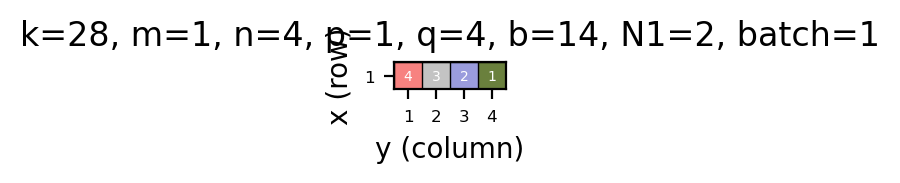

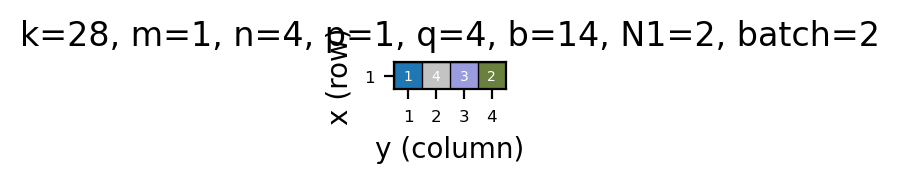

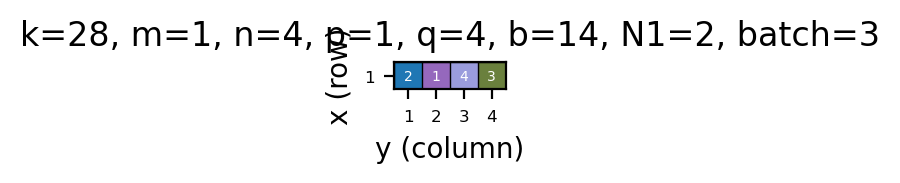

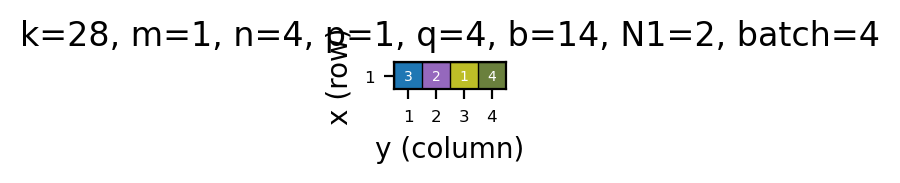

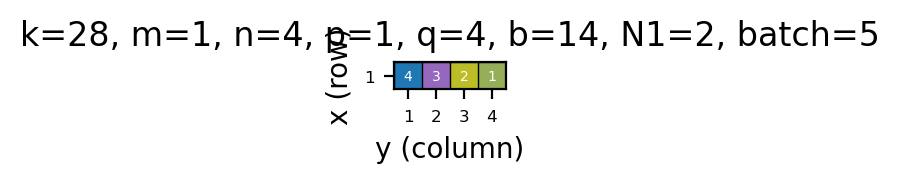

...

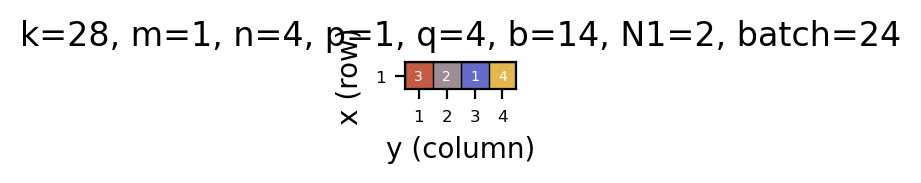

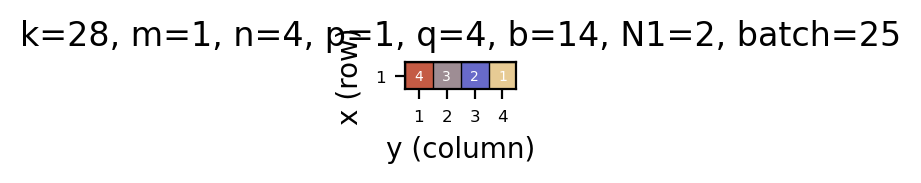

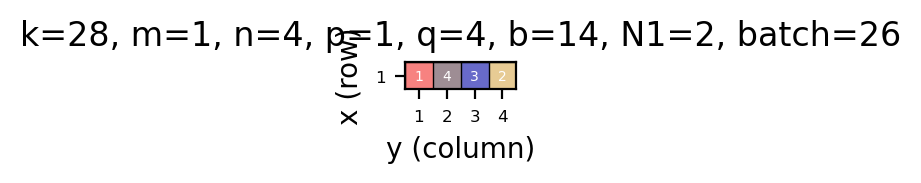

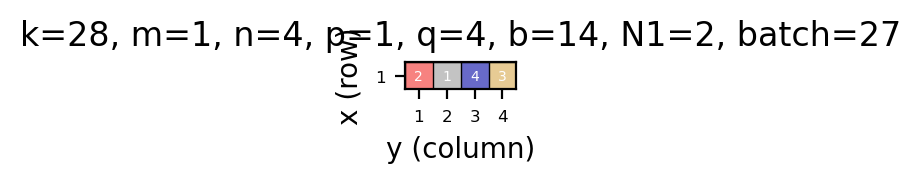

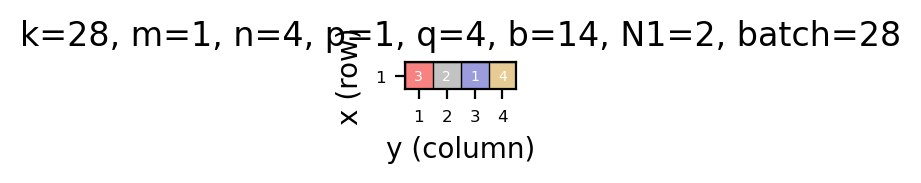

In [23]:
k, m, n, p, q, b, N1 = 28, 1,4,1, 4, 2*7, 2
test_calc_batch_full(k, m, n, p, q, b, N1)

In [24]:
# k, m, n, p, q, b, N1 = 28, 16,48,1, 33, 2*7, 4
# test_calc_batch_full(k, m, n, p, q, b, N1)

In [25]:
# k, m, n, p, q, b, N1 = 3, 4,3,2, 2, 2, 3
# test_calc_batch_full(k, m, n, p, q, b, N1)

k :  32
FAG_opt :  12
r_upper :  16


/var/folders/dx/6lqc8b9n075260nhrpx61w_00000gn/T/ipykernel_59836/1669910971.py:119: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


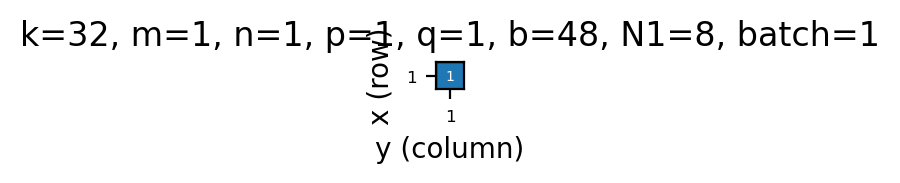

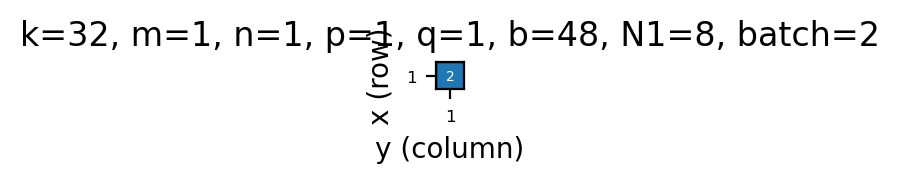

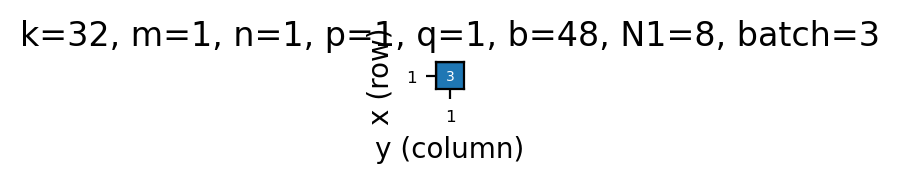

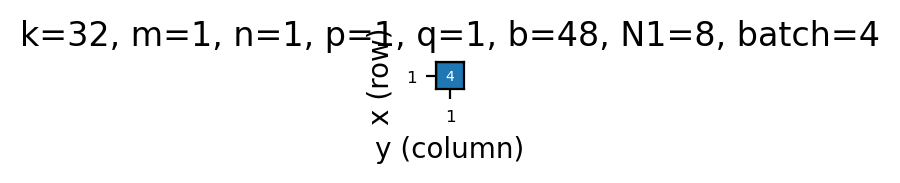

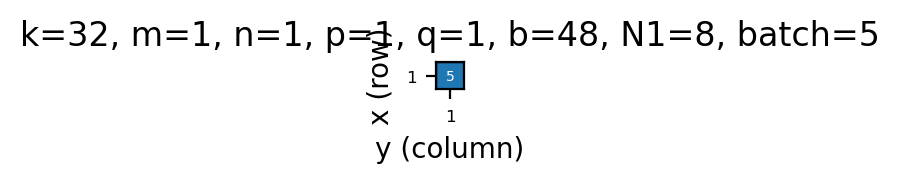

...

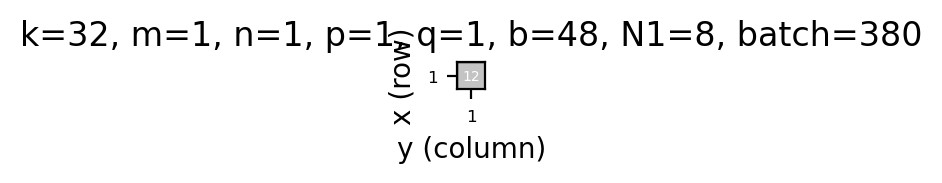

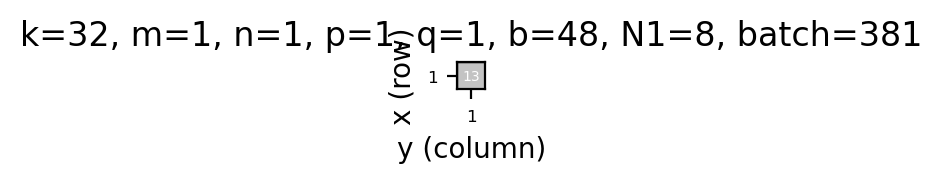

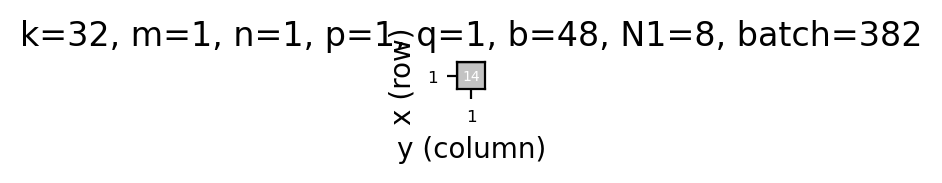

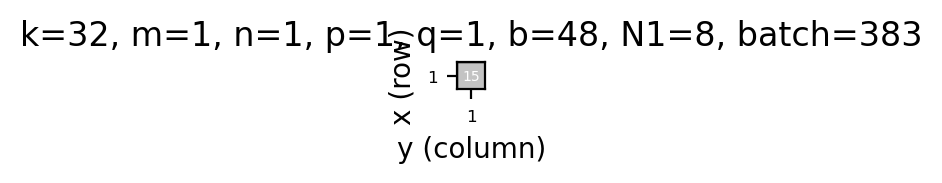

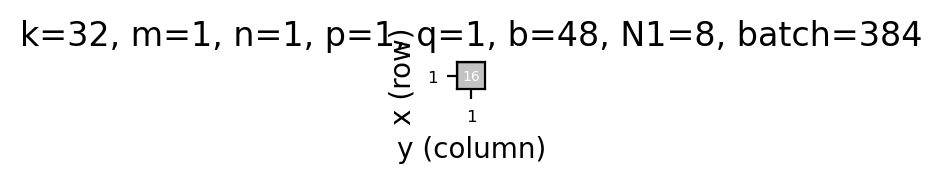

In [26]:
k,m,n,p,q,b,N1 = 32,1,1,1,1,48,8

test_calc_batch_full(k, m, n, p, q, b, N1)

In [16]:
# k,m,n,p,q,b,N1 = 32,4,4,3,3,48,8

# test_calc_batch_full(k, m, n, p, q, b, N1)

In [17]:
# k, m, n,  b, N1 = 8,14,16, 1, 8
# p,q = 4,3

# test_calc_batch_full(k, m, n, p, q, b, N1)

In [18]:
# k, m, n, p, q, b, N1 = 32, 32, 32, 6, 6, 1, 8
# test_calc_batch_full(k, m, n, p, q, b, N1)

In [19]:
# k, m, n, p, q, b, N1 = 32, 32,32, 7, 7, 8, 2
# test_calc_batch_full(k, m, n, p, q, b, N1)

In [20]:
# k, m, n, p, q, b, N1 = 16, 16,16, 7, 7, 8, 2
# test_calc_batch_full(k, m, n, p, q, b, N1)

In [22]:
# k, m, n, p, q, b, N1 = 8, 8,9, 5, 6, 4, 3
# test_calc_batch_full(k, m, n, p, q, b, N1)